# An Analysis of the Number of Comparisons in Quicksort

$$
\newcommand{\defeq}{\mathrel{\mathop:}\mathrel{\mkern-1.2mu}=}
$$

In [4]:
from os import path
import pickle
from sage.misc.persist import SagePickler

if path.exists('g_functions'):
    with open('g_functions', 'rb') as F:
        g_functions = loads(F.read())
else:
    g_functions = {0:1, 1:1}

In [5]:
%%cython

from sympy import symbols, Function, solve, summation, Rational, diff, expand
from sympy.parsing.sympy_parser import parse_expr
from os import path
from math import prod
from __main__ import g_functions

# Define symbolic variables
n, t = symbols('n t', integer=True)

def harmonic_number(n, order):
    """
    Computes the generalized harmonic number H(n, order).

    The generalized harmonic number is defined as:
        H(n, r) = sum(1 / j^r) for j = 1 to n

    Parameters:
        n (int): The number of terms in the sum.
        order (int): The exponent applied to the denominator.

    Returns:
        Rational: The computed harmonic number as a rational value.
    """
    return sum(Rational(1, j ** order) for j in range(1, n + 1))

cdef g_recursive(n):
    """
    Recursively computes the nth term of the sequence g(n) using memoization.

    The function follows the recurrence relation:
        g(n) = (t^(n-1) / n) * sum(g(k-1) * g(n-k) for k in range(1, n+1))

    Memoization is used to store previously computed values in `g_functions` to improve efficiency.

    Parameters:
        n (int): The term index to compute.

    Returns:
        The expanded form of g(n).
    """
    if n in g_functions.keys():
        return g_functions[n]
    else:
        g = expand(t ** (n - 1) * Rational(1, n) * sum(g_recursive(k - 1) * g_recursive(n - k) for k in range(1, n + 1)))
        g_functions[n] = g
        return g

cdef generate_g_functions(n):
    """
    Generates and stores g(n) values using recursion and memoization.

    This function reads previously computed g(n) values from 'output.txt' and 
    stores them in `g_functions` to avoid redundant calculations. If more values 
    are needed, it computes them recursively using `g_recursive(n)`, writes 
    them to the file, and updates `g_functions`.

    Parameters:
        n (int): The maximum index of g(n) values to generate.

    Notes:
        - The function reads existing values from 'output.txt' to reduce computation.
        - It appends newly computed values to the file for future use.
    """
    i = len(g_functions) - 1
    if path.exists('output.txt'):
        with open('output.txt', 'r') as f:
            for line in f:
                # check if line is not empty
                if line.strip():
                    if i > n:
                        break
                    if i in g_functions.keys():
                        continue
                    g_functions[i] = parse_expr(line, local_dict={'t': t})
                    i += 1
    for i in range(i, n + 1):
        g = g_recursive(i)
        #with open('output.txt', 'a') as f:
        #    f.write(str(g)+'\n')

generate_g_functions(92)

In [52]:
#g_functions_float = {n: g if type(g) == int else g.evalf() for n,g in g_functions.items()}

In [12]:
%%cython

from __main__ import harmonic_number, g_functions, n, t
from sympy import symbols, Function, solve, summation, Rational, diff, expand
from sympy.parsing.sympy_parser import parse_expr
from os import path
from math import prod
from sympy.parsing.sympy_parser import standard_transformations

moments = {}
centred_moments = {}

def f(r, n, t, acc=[]):
    """
    Generates combinations of `t` elements from `r` that sum to `n`.

    This function recursively finds all possible ways to select `t` elements 
    from the iterable `r` such that their sum equals `n`. 

    Parameters:
        r (iterable): A sorted iterable of possible values.
        n (int): The target sum.
        t (int): The number of elements in each combination.
        acc (list, optional): An accumulator for storing the current combination.

    Yields:
        list: A valid combination of `t` elements summing to `n`.

    Notes:
        - If `t == 0` and `n >= 0`, a valid combination is yielded.
        - The recursion terminates if `x > n` to avoid unnecessary calculations.
        - `acc` is updated with each valid selection and passed to deeper recursion.
    """
    if t == 0:
        if n >= 0:
            yield acc
        return
    for x in r:
        if x > n:  # <---- do not recurse if sum is larger than `n`
            break
        for lst in f(r, n-x, t-1, acc + [x]):
            yield lst

cdef pgf2moment(g, v, k):
    op = v * diff(g, v, 1)  # z * d/dz applied once
    for _ in range(k - 1):  # Apply (z d/dz) multiple times
        op = v * diff(op, v, 1)
    return op.subs(v, 1)  # Evaluate at z=1

cdef compute_moment(p, order, centred):
    """
    Computes the p-th moment of a distribution using symbolic computation.

    This function determines the moment of order `p` by solving a system of equations
    derived from a polynomial representation involving harmonic numbers and symbolic coefficients.

    Parameters:
        p (int): The order of the moment to compute.
        order (int): The highest order of monomials considered.
        centred (bool): Whether to compute the centered moment (adjusted for mean).

    Returns:
        symbolic expression: The computed moment in terms of `t` and `n`.

    Notes:
        - The function first determines the required number of monomials (basis functions)
          using `f(range(order + 1), order, p + 1)`.
        - It constructs a polynomial using unknown coefficients and harmonic functions.
        - Depending on `centred`, it either differentiates `fun(i)` directly or normalizes it.
        - A system of equations is formed to determine the coefficients.
        - Finally, the solved coefficients are substituted back to get the final moment expression.
    """
    amount = len(list(f(range(order + 1), order, p + 1))) # Number of monomials; we need at least this many equations to solve for the moment
    coefficients = symbols(' '.join([f'c{i}' for i in range(amount)]))
    harmonic_symbols = [Function(f'H{i}', integer=True) for i in range(1, p + 1)]
    
    # Construct the polynomial using harmonic numbers and unknown coefficients
    polynomial = sum(
        coefficients[i] * prod(h(n) ** p if h != n else n ** p for h, p in zip([n] + harmonic_symbols, powers)) 
        for i, powers in enumerate(f(range(order + 1), order, p + 1))
    )

    #fun = lambda i: g_functions[i+1]/(g_functions[i+1].subs(t, 1))
    fun = lambda i: g_functions[i+1]
    # Compute the moment values based on whether we need centered moments
    if centred:
        momentValues = [pgf2moment(fun(i)/(t**(diff(fun(i), t, 1).subs(t, 1))), t, p) for i in range(amount + 1)]
    else:
        momentValues = [pgf2moment(fun(i), t, p) for i in range(amount + 1)]

    # Construct the system of equations
    equations = [
        polynomial.subs({n: i, **dict([(harmonic_symbols[l](n), harmonic_number(i, l+1)) for l in range(len(harmonic_symbols))])}) 
        - momentValues[i-1] 
        for i in range(1, amount + 2)
    ]

    # Solve for coefficients and substitute them back into the polynomial
    solution = solve(equations, coefficients)
    return (polynomial.subs(solution), len(solution) != 0)

cdef search_moment(p, centred):
    """
    Iteratively searches for the correct p-th moment by increasing the order.

    This function attempts to compute the p-th moment, increasing the order
    until a valid moment is found.

    Parameters:
        p (int): The order of the moment to compute.
        centred (bool): Whether to compute the centered moment.

    Returns:
        symbolic expression: The computed moment once a valid solution is found.

    Notes:
        - The search starts with `order = p` and increments until a solution is found.
        - The function `compute_moment(p, order, centred)` is used to attempt moment computation.
        - The process continues until `compute_moment` confirms a valid moment by returning `found = True`.
    """
    found = False
    order = p
    while not found:
        order += 1
        moment, found = compute_moment(p, order, centred)
    return moment

cdef generate_moments(p, centred):
    """
    Generates and stores moments up to order `n`.

    This function reads previously computed moments from a file.
    If additional moments are needed, it computes them using `search_moment` and appends
    them to the file for future use.

    Parameters:
        p (int): The highest order of moments to generate.
        centred (bool): Whether to compute centered moments.

    Notes:
        - Moments are stored in either `moments.txt` or `centred_moments.txt` based on `centred`.
        - Previously computed moments are read from the file to avoid recalculations.
        - Uses `search_moment` to find the appropriate moment expressions.
    """
    i = 1
    harmonic_symbols = [Function(f'H{i}', integer=True) for i in range(1, p + 1)]
    local_dict={'n': n} | {str(h): h for h in harmonic_symbols}
    filename = ("centred_" if centred else "") + 'moments.txt'
    cache = centred_moments if centred else moments
    if path.exists(filename):
        with open(filename, 'r') as f:
            for line in f:
                # check if line is not empty
                if line.strip():
                    if i > p:
                        break
                    cache[i] = parse_expr(line, local_dict=local_dict)
                    i += 1
    for i in range(i, p + 1):
        m = search_moment(i, centred)
        with open(filename, 'a') as f:
            f.write(str(m)+'\n')

generate_moments(2, False)
generate_moments(3, True)

## Sorting Algorithms

Sorting Algorithms are very versatile and are used in many applications. One of the probably most well-known sorting algorithms is Quicksort. The algorithm works as follows:

1. Choose a pivot element from the list.
2. Partition the list so that all elements with values less than the pivot come before the pivot and all elements with values greater than the pivot come after the pivot.
3. Recursively apply the algorithm to the sublists.

### Remark

For reasons of simplicity, we will assume that the list contains only distinct elements.

## Number of Comparisons

- During partitioning, the algorithm compares each element in the list with the pivot element. This means for each iteration of the algorithm, the number of comparisons made is $n-1$, where $n$ is the number of elements in the list.

- The number of comparisons made by Quicksort affects the efficiency of the algorithm i.e. the time it takes to sort the list.

- In the best case, the pivot element is the median of the list, and the number of comparisons is minimized.

- In the worst case, the pivot element is the smallest or largest element in the list, and the number of comparisons is maximized.

### Theorem 1: The worst-case number of comparisons made by Quicksort is $\tfrac{(n-1)n}{2}$.

#### Proof:

The worst-case number of comparisons made by Quicksort is when the pivot element is the smallest or largest element in the list. In this case, the list is partitioned into two sublists of size $n-1$ and $0$. The number of comparisons made by Quicksort in this case is $n-1$ plus the number of comparisons made by Quicksort on the sublists. Therefore, the worst-case number of comparisons made by Quicksort is
$$
\sum_{i=0}^{n-1} i = \tfrac{(n-1)n}{2}.
$$

### Theorem 2: The best-case number of comparisons made by Quicksort is in $O(n \log n)$.

#### Proof: (informaly)

In every iteration we have $n-1$ comparisons. By splitting the list in half we will get roughly $2\cdot \tfrac{n}{2}=n$ comparisons. Since we half the list size every iteration we need $\log n$ iterations to reach a list size of $1$ or $0$. That means over all iterations we made
$$
\approx n \log n = O(n \log n),
$$
comparisons.

## Strategies to Reduce the Number of Comparisons

- Picking multiple elements (e.g. 3) and choosing their median as pivot greatly reduces the amount of needed comparisons.

- Picking a uniformly distributed random element as the pivot does not reduce the amount of needed comparisons on average over all(!) lists, but it can give more "predictable" runtimes.

- Combining both approaches gives very good results.

## Finding the average number of comparisons of Randomized Quicksort

Let $n\in\mathbb{N}$, $X^{(0)}_\emptyset(n)$ and $X^{(k)}_{s}(n)$ for $s\in\{l, r\}^k$, $k\in\mathbb N$, be random variables that independently uniformly at random select a pivot element from a list of size $n$.

We can now rewrite the Randomized Quicksort algorithm as follows:

0. Start with $k=0$ and $s=\emptyset$.
1. Choose a pivot element $X^{(k)}_{s}(n)$ from the list of size $n$.
2. Partition the list so that all elements with values less than the pivot come before the pivot and all elements with values greater than the pivot come after the pivot.
3. If the sublist is empty or has only one element, stop. Otherwise, apply the algorithm to the sublists by incrementing $k$ and adding $l$ respectively $r$ to $s$.

Let $C(n)$ be the random variable that represents the number of comparisons made by Randomized Quicksort on a list of size $n$. We want to find the expected value of $C(n)$.

Let $x_{(1)}, \dots, x_{(n)}$ be the elements of the list such that $x_{(1)} < \dots < x_{(n)}$. Let $i, j\in\{1, \dots, n\}$ with $i < j$ and $C_{i, j}$ be the random variable that is $1$ if $x_{(i)}$ is compared to the $x_{(j)}$ and $0$ otherwise. Then we have
$$
C(n) = \sum_{i=1}^{n-1}\sum_{j=i+1}^{n} C_{i, j},.
$$

### Remark

$C_{i, j}$ is $1$ if and only if either $x_{(i)}$ or $x_{(j)}$ is chosen as the pivot element before any of the $j - i - 1$ elements $x_{(i)}, \dots, x_{(j)}$, because picking any of the elements in between would separate $x_{(i)}$ and $x_{(j)}$.

It follows by induction that the probability that $x_{(i)}$ is compared to $x_{(j)}$ is independent of the size of the list and we get
$$
\mathbb E\left[C_{i, j}\right] = \mathbb P(C_{i, j} = 1) = \tfrac{2}{j - i + 1}.
$$

#### Proof:

We look at the list $x_{(i)}, \dots, x_{(j)}$. The probability that $x_{(i)}$ or $x_{(j)}$ is chosen as the pivot element is $\tfrac{2}{j - i + 1}$.

Now we assume that for a list of size $n\in\mathbb N$ that contains the elements $x_{(i)}, \dots, x_{(j)}$, the probability that $x_{(i)}$ is compared to $x_{(j)}$ is $\tfrac{2}{j - i + 1}$.

We will write $x'_{(1)}, \dots, x'_{(n)}$ for the list, where $x'_{(1)}=x_{(i)}$, …, $x'_{(j-i+1)}=x_{(j)}$ and $x'_{(j-i+2)}$, …, $x'_{(n)}$ are the remaining elements of the list. 

Let $X$ be the random variable that selects a uniformly distributed random element from a list of size $n+1$.
If we add now another element $x'_{(n+1)}$ to this list, the probability that $x_{(i)}$ is compared to $x_{(j)}$ is

$$
\begin{aligned}
\mathbb P\left[\left\{C_{i, j} = 1\right\}\right] &= \sum_{k=1}^{n+1} \mathbb P\left[\left\{X = x'_{(k)}\right\}\right] \cdot \mathbb P\left[\left\{C_{i, j} = 1\right\} \middle| \left\{X = x'_{(k)}\right\}\right] \\
&= \frac{2}{n+1} + \sum_{k=j-i+2}^{n+1} \frac{1}{n+1} \cdot \mathbb P\left[\left\{C_{i, j} = 1\right\} \middle| \left\{X = x'_{(k)}\right\}\right]  \\
&= \frac{2}{n+1} + \frac{1}{n+1} \sum_{k=j-i+2}^{n+1} \frac{2}{j-i+1} \\
&= \frac{2}{n+1} \cdot \left(1 + \frac{n+1-(j-i+2)+1}{j-i+1}\right) \\
&= \frac{2}{n+1} \cdot \frac{n+1}{j-i+1} \\
&= \frac{2}{j-i+1}.
\end{aligned}
$$

### Lemma

Let $n\in\mathbb N$. Then
$$
\sum_{i=1}^{n-1} \sum_{j=2}^{n+1-i} \tfrac{1}{j} = \sum_{j=2}^{n} \sum_{i=1}^{n-j+1} \tfrac{1}{j}.
$$

#### Proof:

Let $n=1$. Then
$$
\begin{aligned}
\sum_{i=1}^{1-1} \sum_{j=2}^{1+1-i} \tfrac{1}{j} &= 0, \\
\sum_{j=2}^{1} \sum_{i=1}^{1-j+1} \tfrac{1}{j} &= 0.
\end{aligned}
$$

Now let $n\in\mathbb N$. Then
$$
\begin{aligned}
\sum_{i=1}^{n} \sum_{j=2}^{n+2-i} \tfrac{1}{j} &= \sum_{i=1}^{n-1} \sum_{j=2}^{n+2-i} \tfrac{1}{j} + \sum_{j=2}^{n+2-n} \tfrac{1}{j} \\
&= \sum_{i=1}^{n-1} \sum_{j=2}^{n+2-i} \tfrac{1}{j} + \tfrac{1}{2} \\
&= \sum_{i=1}^{n-1}\left(\frac{1}{n+2-i} + \sum_{j=2}^{n+1-i} \tfrac{1}{j}\right) + \tfrac{1}{2} \\
&= \sum_{i=1}^{n-1}\frac{1}{n+2-i} + \sum_{i=1}^{n-1} \sum_{j=2}^{n+1-i} \tfrac{1}{j} + \tfrac{1}{2} \\
&\rlap{= \sum_{i=3}^{n+1}\frac{1}{i} + \sum_{j=2}^{n} \sum_{i=1}^{n-j+1} \tfrac{1}{j} + \tfrac{1}{2}}\hphantom{= \sum_{i=2}^{n+1}\frac{1}{i} + \sum_{j=2}^{n} \sum_{i=1}^{n+1-j+1} \tfrac{1}{j} - \sum_{j=2}^{n} \frac{1}{n-j+2}}
\end{aligned}
$$

$$
\begin{aligned}
\hphantom{\sum_{i=1}^{n} \sum_{j=2}^{n+2-i} \tfrac{1}{j} }&= \sum_{i=2}^{n+1}\frac{1}{i} + \sum_{j=2}^{n} \sum_{i=1}^{n-j+1} \tfrac{1}{j} \\
&= \sum_{i=2}^{n+1}\frac{1}{i} + \sum_{j=2}^{n}\left( \sum_{i=1}^{n+1-j+1} \tfrac{1}{j} - \frac{1}{n-j+2} \right) \\
&= \sum_{i=2}^{n+1}\frac{1}{i} + \sum_{j=2}^{n} \sum_{i=1}^{n+1-j+1} \tfrac{1}{j} - \sum_{j=2}^{n} \frac{1}{n-j+2} \\
&= \sum_{i=2}^{n+1}\frac{1}{i} + \sum_{j=2}^{n} \sum_{i=1}^{n+1-j+1} \tfrac{1}{j} - \sum_{j=2}^{n} \frac{1}{j} \\
&= \frac{1}{n+1} + \sum_{j=2}^{n} \sum_{i=1}^{n+1-j+1} \tfrac{1}{j} \\
&= \sum_{j=2}^{n+1} \sum_{i=1}^{n+1-j+1} \tfrac{1}{j} 
\end{aligned}
$$

### Theorem 3: Expected number of comparisons made by Randomized Quicksort

The expected number of comparisons made by Randomized Quicksort on a list of size $n$ is
$$
\mathbb E[C(n)] = (2n + 2)H_n - 4n
$$
where $H_n = \sum_{i=1}^{n} \tfrac{1}{i}$ is the $n$-th harmonic number.

Using that $H_n=O(\log n)$ [3] we get
$$
\mathbb E[C(n)] = O(n\log n).
$$

#### Proof:
$$
\begin{aligned}
\mathbb E[C(n)] &= \mathbb E\left[\sum_{i=1}^{n-1}\sum_{j=i+1}^{n} C_{i, j}\right] \\
&= \sum_{i=1}^{n-1}\sum_{j=i+1}^{n} \mathbb E[C_{i, j}] \\
&= \sum_{i=1}^{n-1}\sum_{j=i+1}^{n} \tfrac{2}{j - i + 1} \\
&\rlap{= \sum_{i=1}^{n-1}\sum_{j=2}^{n+1-i} \tfrac{2}{j}} \hphantom{= 2(n + 1)\sum_{j=2}^{n} \tfrac{1}{j} - 2(n - 1)}
\end{aligned}
$$

$$
\begin{aligned}
\hphantom{\mathbb E[C(n)]}&= \sum_{j=2}^{n} \sum_{i=1}^{n-j+1} \tfrac{2}{j} \\
&= \sum_{j=2}^{n} \tfrac{2(n-j+1)}{j} \\
&= 2(n + 1)\sum_{j=2}^{n} \tfrac{1}{j} - 2\sum_{j=2}^{n} 1 \\
&= 2(n + 1)\sum_{j=2}^{n} \tfrac{1}{j} - 2(n - 1) \\
&= 2(n + 1)\sum_{j=1}^{n} \tfrac{1}{j} - 4n \\
&= 2(n + 1)H_n - 4n \\
&= (2n + 2)H_n - 4n.
\end{aligned}
$$

## Moment einmal! ... oder zweimal?
### Higher Moments of Randomized Quicksort

Let $n\in\mathbb N_0$, $k\in\mathbb N_0$ and $s\in\{l, r\}^k$.

If $n\leq 1$, we define $C^{(k)}_s(n) \defeq 0$. Otherwise,
$$
\begin{aligned}
C^{(k)}_s(n) &\defeq n - 1 + C^{(k+1)}_{s\times\{l\}}\left(X^{(k)}_{s}(n) - 1\right) + C^{(k+1)}_{s\times\{r\}}\left(n - X^{(k)}_{s}(n)\right). \\
\end{aligned}
$$

### Lemma:

For all $n, k, m\in\mathbb N_0$ and $s\in\{l, r\}^k$, $t\in\{l, r\}^m$,  $C^{(k)}_s(n)$ and $C^{(m)}_t(n)$ are identically distributed.

### Lemma:

For all $n, k\in\mathbb N_0$ and $s\in\{l, r\}^k$,  $C^{(k+1)}_{s\times\{l\}}(X^{(k)}_{s}(n) - 1)$ and $C^{(k+1)}_{s\times\{r\}}(n - X^{(k)}_{s}(n))$ are idenpendent.

We can now write the following recursive formula for $C(n)$:
$$
\begin{aligned}
C(n) = C^{(0)}_{\emptyset}(n) = n - 1 + C^{(1)}_{\{l\}}(X^{(0)}_\emptyset(n) - 1) + C^{(1)}_{\{r\}}(n - X^{(0)}_\emptyset(n)).
\end{aligned}
$$

The idea is that the number of comparisons made by Randomized Quicksort on a list of size $n$ can be expressed as the sum of the number of comparisons made by Randomized Quicksort on the sublists and the number of comparisons made during partitioning.

### Theorem 4: The probability generating function of $C(n)$

Let $n\in\mathbb N_0$. The probability generating function of $C(n)$ is
$$
g_n(t) \defeq g_{C(n)}(t) = \begin{cases}
1 & \text{if } n\leq 1, \\
t^{n-1} + \tfrac{1}{n}\sum_{k=1}^{n} g_{k-1}(t) \cdot g_{n-k}(t) & \text{otherwise}.
\end{cases}
$$


#### Proof:

Let $n\in\mathbb N_0$. If $n\leq 1$, we have
$$
\begin{aligned}
g_n(t) = \mathbb E[t^{0}] = 1.
\end{aligned}
$$
Otherwise, we have
$$
\begin{aligned}
g_n(t) &= \mathbb E\left[t^{n-1 + C^{(1)}_{\{l\}}(X^{(0)}_\emptyset(n) - 1) + C^{(1)}_{\{r\}}(n - X^{(0)}_\emptyset(n))}\right] \\
&\rlap{= \mathbb E\left[t^{n-1} \cdot t^{C^{(1)}_{\{l\}}(X^{(0)}_\emptyset(n) - 1)} \cdot t^{C^{(1)}_{\{r\}}(n - X^{(0)}_\emptyset(n))}\right]}\hphantom{= t^{n-1} \cdot \sum_{k=1}^{n} \mathbb P\left[\left\{X^{(0)}_\emptyset(n) = k\right\}\right] \cdot \mathbb E\left[t^{C^{(1)}_{\{l\}}(k - 1)} \cdot t^{C^{(1)}_{\{r\}}(n - k)}\right]}
\end{aligned}
$$

$$
\begin{aligned}
&= t^{n-1} \cdot\mathbb E\left[ t^{C^{(1)}_{\{l\}}(X^{(0)}_\emptyset(n) - 1)} \cdot t^{C^{(1)}_{\{r\}}(n - X^{(0)}_\emptyset(n))}\right]\\
\hphantom{g_n(t)}&= t^{n-1} \cdot \sum_{k=1}^{n} \mathbb P\left[\left\{X^{(0)}_\emptyset(n) = k\right\}\right] \cdot \mathbb E\left[t^{C^{(1)}_{\{l\}}(k - 1)} \cdot t^{C^{(1)}_{\{r\}}(n - k)}\right] \\
\hphantom{g_n(t)}&= t^{n-1} \cdot \sum_{k=1}^{n} \tfrac{1}{n} \cdot \mathbb E\left[t^{C^{(1)}_{\{l\}}(k - 1)}\right]\mathbb E\left[ t^{C^{(1)}_{\{r\}}(n - k)}\right] \\
\hphantom{g_n(t)}&= t^{n-1} \cdot \tfrac{1}{n}  \sum_{k=1}^{n}  \mathbb E\left[t^{C(k - 1)}\right]\mathbb E\left[ t^{C(n - k)}\right] \\
&= t^{n-1} \cdot \tfrac{1}{n}\sum_{k=1}^{n} g_{k-1}(t) \cdot g_{n-k}(t).
\end{aligned}
$$

We can now use the probability generating function to calculate the higher moments of $C(n)$, since
$$
\begin{aligned}
\mathbb E[C(n)^k] &= \left(t\frac{\partial}{\partial t}\right)^{k}g_n(t)\bigg|_{t=1},\\
\mathbb E\left[\left(C(n) - \mathbb E[C(n)]\right)^k\right] &= \left(t\frac{\partial}{\partial t}\right)^{k}\left(\frac{g_n(t)}{t^{E[C(n)]}}\right)\bigg|_{t=1}.
\end{aligned} 
$$

### Definition: Generalized Harmonic Numbers

Let $n\in\mathbb N$ and $k\in\mathbb N$. The $n$-th generalized harmonic number of order $k$ is
$$
H_{n, k} \defeq \sum_{i=1}^{n} \tfrac{1}{i^k}.
$$

With our newly acquired knowledge, we can try to find explicit expressions for the moments of $C(n)$. Let $k\in\mathbb N$. [2] claims that the $k$-th moment of $C(n)$ has an explicit expression given by a polynomial in $n$, $H_{n, 1}$, …, $H_{n, k}$. No prove is given in [2], and there is also no claim about which degree the polynomial has. But the claim is supported by the fact that the first eight moments of $C(n)$ have been computed and are given in [2].

In [27]:
from sympy import symbols, Function, solve, summation, Rational, diff, expand, collect

g_functions_example = {0:1, 1:1}

t = symbols('t', integer=True)

def g_recursive_example(n):
    """
    Recursively computes the nth term of the sequence g(n) using memoization.

    The function follows the recurrence relation:
        g(n) = (t^(n-1) / n) * sum(g(k-1) * g(n-k) for k in range(1, n+1))

    Memoization is used to store previously computed values in `g_functions` to improve efficiency.

    Parameters:
        n (int): The term index to compute.

    Returns:
        The expanded form of g(n).
    """
    if n in g_functions_example.keys():
        return g_functions_example[n]
    else:
        g = expand(t ** (n - 1) * Rational(1, n) * sum(g_recursive_example(k - 1) * g_recursive_example(n - k) for k in range(1, n + 1)))
        g_functions_example[n] = g
        return collect(g, t)

``` python
from sympy import symbols, Function, solve, summation, Rational, diff, expand, collect

g_functions_example = {0:1, 1:1}

t = symbols('t', integer=True)

def g_recursive_example(n):
    if n in g_functions_example.keys():
        return g_functions_example[n]
    else:
        g = expand(t ** (n - 1) * Rational(1, n) * sum(g_recursive_example(k - 1) * g_recursive_example(n - k) for k in range(1, n + 1)))
        g_functions_example[n] = g
        return collect(g, t)
```

In [28]:
g_recursive_example(6)

t**5*(2*t**10/45 + t**9/45 + t**8/15 + 4*t**7/45 + 2*t**6/9 + t**5/18 + 7*t**4/18 + t**3/9)

In [29]:
g_functions_example

{0: 1,
 1: 1,
 2: t,
 3: 2*t*t**2/3 + t**2/3,
 4: t**3*t**3/3 + t**2*t**3/6 + t*t**3/2,
 5: 2*t**4*t**6/15 + t**4*t**5/15 + t**4*t**4/5 + 4*t**3*t**4/15 + t**2*t**4/3,
 6: 2*t**5*t**10/45 + t**5*t**9/45 + t**5*t**8/15 + 4*t**5*t**7/45 + 2*t**5*t**6/9 + t**5*t**5/18 + 7*t**4*t**5/18 + t**3*t**5/9}

In [30]:
def pgf2moment(g, v, k):
    op = v * diff(g, v, 1)  # z * d/dz applied once
    for _ in range(k - 1):  # Apply (z d/dz) multiple times
        op = v * diff(op, v, 1)
    return op.subs(v, 1)  # Evaluate at z=1

def compute_moment(p, order, centred):
    """
    Computes the p-th moment of a distribution using symbolic computation.

    This function determines the moment of order `p` by solving a system of equations
    derived from a polynomial representation involving harmonic numbers and symbolic coefficients.

    Parameters:
        p (int): The order of the moment to compute.
        order (int): The highest order of monomials considered.
        centred (bool): Whether to compute the centered moment (adjusted for mean).

    Returns:
        symbolic expression: The computed moment in terms of `t` and `n`.

    Notes:
        - The function first determines the required number of monomials (basis functions)
          using `f(range(order + 1), order, p + 1)`.
        - It constructs a polynomial using unknown coefficients and harmonic functions.
        - Depending on `centred`, it either differentiates `fun(i)` directly or normalizes it.
        - A system of equations is formed to determine the coefficients.
        - Finally, the solved coefficients are substituted back to get the final moment expression.
    """
    amount = len(list(f(range(order + 1), order, p + 1))) # Number of monomials; we need at least this many equations to solve for the moment
    coefficients = symbols(' '.join([f'c{i}' for i in range(amount)]))
    harmonic_symbols = [Function(f'H{i}', integer=True) for i in range(1, p + 1)]
    
    # Construct the polynomial using harmonic numbers and unknown coefficients
    polynomial = sum(
        coefficients[i] * prod(h(n) ** p if h != n else n ** p for h, p in zip([n] + harmonic_symbols, powers)) 
        for i, powers in enumerate(f(range(order + 1), order, p + 1))
    )

    #fun = lambda i: g_functions[i+1]/(g_functions[i+1].subs(t, 1))
    fun = lambda i: g_functions[i+1]
    # Compute the moment values based on whether we need centered moments
    if centred:
        momentValues = [pgf2moment(fun(i)/(t**(diff(fun(i), t, 1).subs(t, 1))), t, p) for i in range(amount + 1)]
    else:
        momentValues = [pgf2moment(fun(i), t, p) for i in range(amount + 1)]

    # Construct the system of equations
    equations = [
        polynomial.subs({n: i, **dict([(harmonic_symbols[l](n), harmonic_number(i, l+1)) for l in range(len(harmonic_symbols))])}) 
        - momentValues[i-1] 
        for i in range(1, amount + 2)
    ]

    # Solve for coefficients and substitute them back into the polynomial
    solution = solve(equations, coefficients)
    return (polynomial.subs(solution), len(solution) != 0)

``` python
def pgf2moment(g, v, k):
    g = v * diff(g, v, 1)  # z * d/dz applied once
    for _ in range(k - 1):  # Apply (z d/dz) multiple times
        g = v * diff(g, v, 1)
    return g.subs(v, 1)  # Evaluate at z=1

def compute_moment(p, order, centred):
    amount = len(list(f(range(order + 1), order, p + 1))) # Number of monomials; we need at least this many equations to solve for the moment
    coefficients = symbols(' '.join([f'c{i}' for i in range(amount)]))
    harmonic_symbols = [Function(f'H{i}', integer=True) for i in range(1, p + 1)]
    
    # Construct the polynomial using harmonic numbers and unknown coefficients
    polynomial = sum(
        coefficients[i] * prod(h(n) ** p if h != n else n ** p for h, p in zip([n] + harmonic_symbols, powers)) 
        for i, powers in enumerate(f(range(order + 1), order, p + 1))
    )
```

``` python
    if centred:
        momentValues = [pgf2moment(g_functions[i+1]/(t**(diff(g_functions[i+1], t, 1).subs(t, 1))), t, p) for i in range(amount + 1)]
    else:
        momentValues = [pgf2moment(g_functions[i+1], t, p) for i in range(amount + 1)]

    equations = [
        polynomial.subs({n: i, **dict([(harmonic_symbols[l](n), harmonic_number(i, l+1)) for l in range(len(harmonic_symbols))])}) 
        - momentValues[i-1] 
        for i in range(1, amount + 2)
    ]
    solution = solve(equations, coefficients)
    return (polynomial.subs(solution), len(solution) != 0)
```

In [34]:
compute_moment(1, 2, False)[0]

2*n*H1(n) - 4*n + 2*H1(n)

In [35]:
compute_moment(2, 3, True)[0]

-4*n**2*H2(n) + 7*n**2 - 2*n*H1(n) - 8*n*H2(n) + 13*n - 2*H1(n) - 4*H2(n)

In [40]:
centred_moments[3]

16*n**3*H3(n) - 19*n**3 + 12*n**2*H2(n) + 48*n**2*H3(n) - 81*n**2 + 14*n*H1(n) + 24*n*H2(n) + 48*n*H3(n) - 104*n + 14*H1(n) + 12*H2(n) + 16*H3(n)

``` python
def search_moment(p, centred):
    found = False
    order = p
    while not found:
        order += 1
        moment, found = compute_moment(p, order, centred)
    return moment
```

In [41]:
import random as r

def quicksort(arr, random=True):
    if len(arr) <= 1:
        return (arr, 0)
    else:
        pivot = r.randrange(len(arr)) if random else 0
        piv_elem = arr[pivot]
        left = []
        right = []
        for i in range(len(arr)):
            if i == pivot:
                continue
            if arr[i] < piv_elem:
                left.append(arr[i])
            else:
                right.append(arr[i])
        left, comp_left = quicksort(left)
        right, comp_right = quicksort(right)
        return (left + [piv_elem] + right, len(arr) - 1 + comp_left + comp_right)

``` python
import random as r

def quicksort(arr, random=True):
    if len(arr) <= 1:
        return (arr, 0)
    else:
        pivot = r.randrange(len(arr)) if random else 0
        piv_elem = arr[pivot]
        left = []
        right = []
        for i in range(len(arr)):
            if i == pivot:
                continue
            if arr[i] < piv_elem:
                left.append(arr[i])
            else:
                right.append(arr[i])
        left, comp_left = quicksort(left)
        right, comp_right = quicksort(right)
        return (left + [piv_elem] + right, len(arr) - 1 + comp_left + comp_right)
```

In [9]:
quicksort([3,2,1,5])

([1, 2, 3, 5], 4)

In [43]:
import time
from scipy.stats import moment

def measureSort(l, f):
    r.shuffle(l)
    start_time = time.time_ns()
    comp = f(l)[1]
    end_time = time.time_ns()
    execution_time = end_time - start_time
    return (int(comp), float(execution_time))

def computeMoment(f, k = 1, centred=True, iterations = 1000):
    return moment([f() for i in range(iterations)], order=k, center=None if centred else 0.0)

``` python
import time
from scipy.stats import moment

def measureSort(l, f):
    r.shuffle(l)
    start_time = time.time_ns()
    comp = f(l)[1]
    end_time = time.time_ns()
    execution_time = end_time - start_time
    return (int(comp), float(execution_time))

def computeMoment(f, k = 1, centred=True, iterations = 1000):
    return moment([f() for i in range(iterations)], order=k, center=None if centred else 0.0)
```

In [44]:
import matplotlib.pyplot as plt
import numpy as np
import math

def getMomentValues(p, centred, amount, step=1):
    mom = centred_moments[p] if centred else moments[p]
    harmonic_symbols = [Function(f'H{i}', integer=True) for i in range(1, p + 1)]
    return [float(mom.subs({n: i, **dict([(harmonic_symbols[l](n),  harmonic_number(i, l+1)) for l in range(len(harmonic_symbols))])})) for i in range(1, amount * step + 1, step)]

def compareMoment(n, order=1, centred=True, iterations = 1000):
    x = np.arange(1, n + 1)
    y = np.array([computeMoment(lambda: measureSort(list(range(k)), quicksort)[0], k = order, centred = centred, iterations = iterations) for k in x])

    mom = getMomentValues(order, centred, n)

    plt.figure(figsize=(8, 5))

    # Scatter plot
    plt.scatter(x, y, color='blue', zorder=3, label="Measured Data")
    plt.scatter(x, mom, color='red', zorder=3, label="Actual Data")

    # Fine y-axis scale
    y_min, y_max = min(y), max(y)
    y_ticks = np.arange(0, math.ceil(y_max), math.ceil(y_max) / 20)
    plt.yticks(y_ticks)

    # Horizontal reference lines at each y value
    for i in range(len(x)):
        plt.hlines(y[i], xmin=x[i] - 0.1, xmax=x[i] + 0.1, colors='gray', linestyles='dotted', alpha=0.7)

    # Thin vertical lines from x-axis to points
    plt.vlines(x, ymin=0, ymax=y, colors='gray', linestyles='dotted', alpha=0.7)

    # Remove x-axis and y-axis margins
    plt.xticks(x)
    plt.xlim(min(x), max(x)*(1.05))
    plt.ylim(0, max(y)*(1.05))  # This removes the margin at the bottom

    # Grid for clarity
    plt.grid(True, linestyle='dotted', alpha=0.5)

    plt.show()

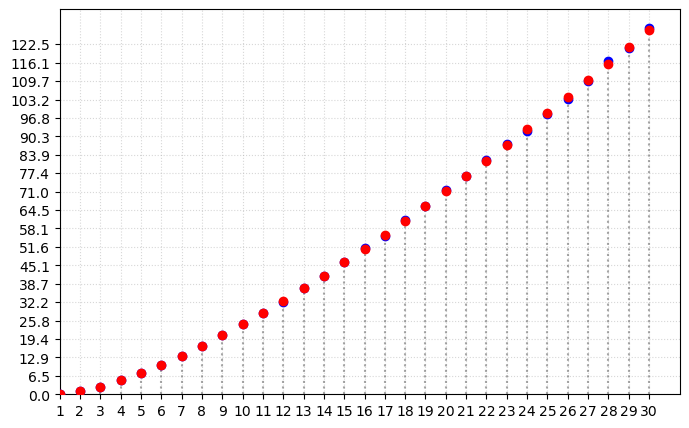

In [47]:
compareMoment(30, order=1, centred=False, iterations = 1000)

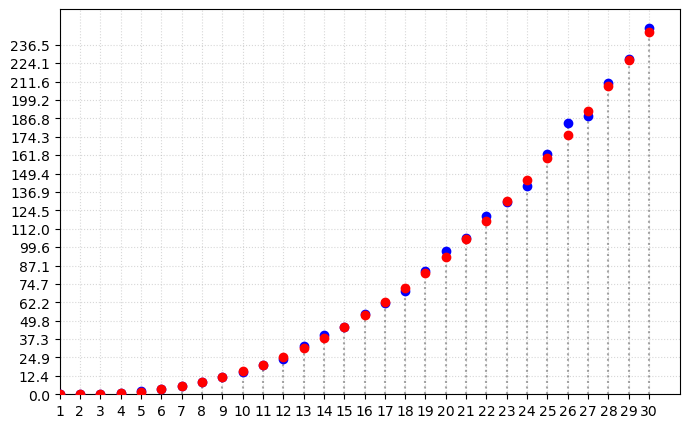

In [79]:
compareMoment(30, order=2, centred=True, iterations=5000)

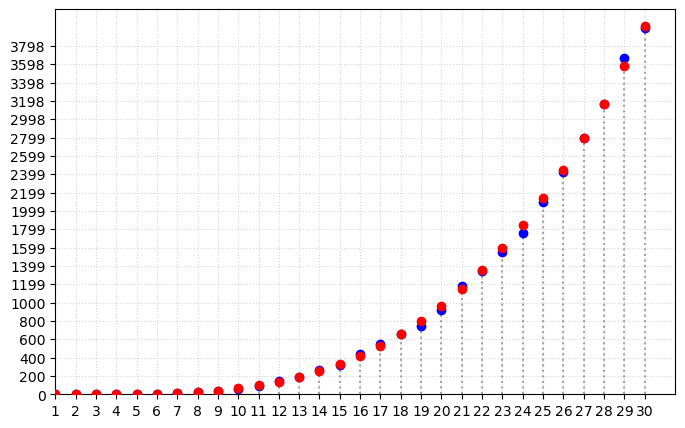

In [80]:
compareMoment(30, order=3, centred=True, iterations=20000)

## Probability Distribution of the Number of Comparisons

Given the probability generating function of $C(n)$, we can now also compute the probability distribution of $C(n)$ for a given $n\in\mathbb N$. Let $k\in\mathbb N_0$. Then we have

$$
\mathbb P\left[\left\{C(n) = k\right\}\right] = \frac{1}{k!}\frac{\partial^k g_n(t)}{\partial t^k}\bigg|_{t=0}.
$$

In [56]:
class DensityFuntion():
    def __init__(self, approx=False):
        self.probabilities = {}
        self.approx = approx
        self.lowerBound = None
        self.upperBound = None

    def probability(self, n):
        if n in self.probabilities:
            return self.probabilities[n]
        else:
            return 0. if self.approx else 0

    def addProbability(self, n, p):
        if p > 0:
            self.probabilities[n] = float(p) if self.approx else p
            if self.lowerBound == None or n < self.lowerBound:
                self.lowerBound = n
            if self.upperBound == None or n > self.upperBound:
                self.upperBound = n

    def check(self):
        return sum(self.probabilities.values()) == 1

def getDensity(n, approx=False):
    d = DensityFuntion(approx)
    k = 0
    g = g_functions_float[n] if approx else g_functions[n]
    p = g.subs(t, 0)
    d.addProbability(0, p)
    foundStart = p > 0
    isZero = p == 0
    while not (foundStart and isZero):
        k += 1
        g = diff(g, t, 1) / k
        p = g.subs(t, 0)
        d.addProbability(k, p)
        foundStart = foundStart or p > 0
        isZero = p == 0
    return d

In [110]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
from math import log10, floor
from matplotlib.ticker import MaxNLocator

def getData(n):
    d = getDensity(n, False)
    return {n: d.probability(n) for n in range(d.lowerBound, d.upperBound + 1)}

def createAnimation(n):
    plt.ioff()
    fig, ax = plt.subplots()
    ax.set_xticks([0])
    
    def update(frame):
        frame += 1
        data = getData(frame)
        x_values = sorted(data.keys())  # Ensure they are in order
        y_values = [data[x] for x in x_values]
        ax.clear()
        ax.bar(x_values, y_values, width=1, color='blue')
        
        # Dynamically update axes limits
        ax.xaxis.set_major_locator(MaxNLocator(integer=True))
        if frame == 0:
            ax.set_xticks([0])
        if frame == 1:
            ax.set_xticks([1])
        elif frame == 2:
            ax.set_xticks([2,3])
    
        max_prob = max(y_values)
        step = 10 ** (int(floor(log10(abs(max_prob)))))
        amount = int(max_prob / step)
        y_ticks = [step * i for i in range(amount + 2)]
        ax.set_yticks(y_ticks)
        
        plt.ylim(0, min(1, y_ticks[-1]))
        
        return line, ax

    # Create animation
    ani = animation.FuncAnimation(fig, update, frames=n, interval=600, blit=False)

    # Display animation in Jupyter Notebook
    return HTML(ani.to_jshtml())

In [112]:
createAnimation(30)

In [63]:
class Histogram():
    def __init__(self, lowerBound, upperBound):
        self.hist = {}
        self.lowerBound = lowerBound
        self.upperBound = upperBound
        self.amount = 0

    def add(self, x):
        if x < self.lowerBound or x > self.upperBound:
            raise Exception("Sorry, no numbers below zero")
        self.amount += 1
        num = self.hist[x] if x in self.hist else 0
        self.hist[x] = num + 1

    def getHist(self):
        return [float(self.hist[n]) / self.amount if n in self.hist else 0. for n in range(self.lowerBound, self.upperBound + 1)]

In [74]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
from math import log10, floor
from matplotlib.ticker import MaxNLocator

def createAnimation(n, k):
    plt.ioff()
    d = getDensity(k, False)
    fig, ax = plt.subplots()
    ax.xaxis.set_major_locator(MaxNLocator(integer=True))
    data = {n: d.probability(n) for n in range(d.lowerBound, d.upperBound + 1)}
    x_values = sorted(data.keys())  # Ensure they are in order
    y_values = [data[x] for x in x_values]
    hist = Histogram(d.lowerBound, d.upperBound)
    
    def update(frame):
        ax.clear()
        ax.bar(x_values, y_values, width=1, color='blue')
        comp = measureSort(list(range(k)), quicksort)[0]
        if frame > 0:
            hist.add(comp)
            histData = hist.getHist()
            ax.bar(x_values, histData, width=1, color='red')
            max_prob = max(max(y_values), max(histData))
        else:
            max_prob = max(y_values)
        step = 10 ** (int(floor(log10(abs(max_prob)))))
        amount = int(max_prob / step)
        y_ticks = [step * i for i in range(amount + 2)]
        ax.set_yticks(y_ticks)
        
        plt.ylim(0, min(1, y_ticks[-1]))
        
        return line, ax

    # Create animation
    ani = animation.FuncAnimation(fig, update, frames=n, interval=600, blit=False)

    # Display animation in Jupyter Notebook
    return HTML(ani.to_jshtml())

In [77]:
createAnimation(1000, 10)

In [132]:
import pickle
from sage.misc.persist import SagePickler

with open('g_functions', 'wb') as F:
    F.write(dumps(g_functions))
    
with open('g_functions_float', 'wb') as F:
    F.write(dumps(g_functions_float))

In [5]:
import pickle
from sage.misc.persist import SagePickler

with open('g_functions', 'rb') as F:
    g_functions = loads(F.read())

# Conclusion

We have seen that the expected number of comparisons made by Randomized Quicksort tends to the best-case and the algorithm performs well on average.

It is hard to conclude anything concrete about the runtime since the swapping of elements is not considered in this analysis. However, the number of comparisons is a good indicator of the runtime of the algorithm.

A similar analysis could be done for the number of swaps made by Randomized Quicksort, as in [1].

# References

<div class="csl-bib-body" style="line-height: 1.35; ">
  <div class="csl-entry" style="clear: left; ">
    <div class="csl-left-margin" style="float: left; padding-right: 0.5em;text-align: right; width: 1em;">[1]</div><div class="csl-right-inline" style="margin: 0 .4em 0 1.5em;">Y. Yao, ‘A Detailed Analysis of Quicksort Algorithms with Experimental Mathematics’.</div>
  </div>
  <span class="Z3988" title="url_ver=Z39.88-2004&amp;ctx_ver=Z39.88-2004&amp;rfr_id=info%3Asid%2Fzotero.org%3A2&amp;rft_val_fmt=info%3Aofi%2Ffmt%3Akev%3Amtx%3Ajournal&amp;rft.genre=article&amp;rft.atitle=A%20Detailed%20Analysis%20of%20Quicksort%20Algorithms%20with%20Experimental%20Mathematics&amp;rft.aufirst=Yukun&amp;rft.aulast=Yao&amp;rft.au=Yukun%20Yao&amp;rft.language=en"></span>
  <div class="csl-entry" style="clear: left; ">
    <div class="csl-left-margin" style="float: left; padding-right: 0.5em;text-align: right; width: 1em;">[2]</div><div class="csl-right-inline" style="margin: 0 .4em 0 1.5em;">S. B. Ekhad and D. Zeilberger, ‘A Detailed Analysis of Quicksort Running Time’, Mar. 09, 2019, <i>arXiv</i>: arXiv:1903.03708. doi: <a href="https://doi.org/10.48550/arXiv.1903.03708">10.48550/arXiv.1903.03708</a>.</div>
  </div>
  <span class="Z3988" title="url_ver=Z39.88-2004&amp;ctx_ver=Z39.88-2004&amp;rfr_id=info%3Asid%2Fzotero.org%3A2&amp;rft_id=info%3Adoi%2F10.48550%2FarXiv.1903.03708&amp;rft_val_fmt=info%3Aofi%2Ffmt%3Akev%3Amtx%3Adc&amp;rft.type=preprint&amp;rft.title=A%20Detailed%20Analysis%20of%20Quicksort%20Running%20Time&amp;rft.description=One%20of%20the%20greatest%20algorithms%20of%20all%20time%20is%20Quicksort.%20Its%20average%20running%20time%20is%20famously%20O(nlog(n))%2C%20and%20its%20variance%2C%20less%20famously%2C%20is%20O(n%5E2)%20(hence%20its%20standard%20deviation%20is%20O(n)).%20But%20what%20about%20higher%20moments%3F%20Here%20we%20find%20explicit%20expressions%20for%20the%20first%20eight%20moments%2C%20their%20scaled%20limits%2C%20and%20we%20describe%20how%20to%20compute%2C%20approximately%20(but%20very%20accurately)%2C%20percentiles%20of%20running%20time%20for%20any%20list-length&amp;rft.identifier=urn%3Adoi%3A10.48550%2FarXiv.1903.03708&amp;rft.aufirst=Shalosh%20B.&amp;rft.aulast=Ekhad&amp;rft.au=Shalosh%20B.%20Ekhad&amp;rft.au=Doron%20Zeilberger&amp;rft.date=2019-03-09&amp;rft.language=en"></span>
  <div class="csl-entry" style="clear: left; ">
    <div class="csl-left-margin" style="float: left; padding-right: 0.5em;text-align: right; width: 1em;">[3]</div><div class="csl-right-inline" style="margin: 0 .4em 0 1.5em;">N. Kurt, <i>Stochastik für Informatiker: Eine Einführung in einheitlich strukturierten Lerneinheiten</i>. Berlin, Heidelberg: Springer Berlin Heidelberg, 2020. doi: <a href="https://doi.org/10.1007/978-3-662-60516-5">10.1007/978-3-662-60516-5</a>.</div>
  </div>
  <span class="Z3988" title="url_ver=Z39.88-2004&amp;ctx_ver=Z39.88-2004&amp;rfr_id=info%3Asid%2Fzotero.org%3A2&amp;rft_id=urn%3Aisbn%3A978-3-662-60515-8%20978-3-662-60516-5&amp;rft_val_fmt=info%3Aofi%2Ffmt%3Akev%3Amtx%3Abook&amp;rft.genre=book&amp;rft.btitle=Stochastik%20f%C3%BCr%20Informatiker%3A%20Eine%20Einf%C3%BChrung%20in%20einheitlich%20strukturierten%20Lerneinheiten&amp;rft.place=Berlin%2C%20Heidelberg&amp;rft.publisher=Springer%20Berlin%20Heidelberg&amp;rft.aufirst=Noemi&amp;rft.aulast=Kurt&amp;rft.au=Noemi%20Kurt&amp;rft.date=2020&amp;rft.isbn=978-3-662-60515-8%20978-3-662-60516-5&amp;rft.language=de"></span>
</div>